# Detectron2 for RDD2020

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

# Install detectron2

In [34]:
# install dependencies: 
!pip install pyyaml==5.1 pycocotools>=2.0.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

You should consider upgrading via the '/home/rahul/.virtualenvs/rdd/bin/python -m pip install --upgrade pip' command.
1.6.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [35]:
! nvidia-smi

Tue Aug 18 13:06:50 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.51.06    Driver Version: 450.51.06    CUDA Version: 11.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  GeForce GTX 165...  On   | 00000000:01:00.0  On |                  N/A |
| N/A   48C    P8     8W /  N/A |   1039MiB /  3911MiB |     10%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  GeForce GTX 108...  On   | 00000000:09:00.0 Off |                  N/A |
| 23%   

In [36]:
#from google.colab import drive
#drive.mount('/content/gdrive')
#DETECTRON2_DATASETS = "/content/gdrive/My Drive/Projects/Windspect/code/data"
#ROADDAMAGE_DATASET  = DETECTRON2_DATASETS+"/rdd2020"

DETECTRON2_DATASETS = "/media/rahul/Karmic/data"
ROADDAMAGE_DATASET  = DETECTRON2_DATASETS+"/rdd2020"
DATASET_BASE_PATH = ROADDAMAGE_DATASET

! du -h "$ROADDAMAGE_DATASET/test1"

0	/media/rahul/Karmic/data/rdd2020/test1/Czech/annotations/xmls
0	/media/rahul/Karmic/data/rdd2020/test1/Czech/annotations
25M	/media/rahul/Karmic/data/rdd2020/test1/Czech/images
25M	/media/rahul/Karmic/data/rdd2020/test1/Czech
0	/media/rahul/Karmic/data/rdd2020/test1/India/annotations/xmls
0	/media/rahul/Karmic/data/rdd2020/test1/India/annotations
65M	/media/rahul/Karmic/data/rdd2020/test1/India/images
65M	/media/rahul/Karmic/data/rdd2020/test1/India
0	/media/rahul/Karmic/data/rdd2020/test1/Japan/annotations/xmls
0	/media/rahul/Karmic/data/rdd2020/test1/Japan/annotations
107M	/media/rahul/Karmic/data/rdd2020/test1/Japan/images
107M	/media/rahul/Karmic/data/rdd2020/test1/Japan
197M	/media/rahul/Karmic/data/rdd2020/test1


In [37]:
_PREDEFINED_SPLITS_GRC_MD = {}
_PREDEFINED_SPLITS_GRC_MD["rdd2020_source"] = {
    "rdd2020_train": ( "train/Czech", 
                       "train/India", 
                       "train/Japan")
}

_PREDEFINED_SPLITS_GRC_MD["rdd2020"] ={
    "rdd2020_val"  : ( "lval/Czech", 
                       "lval/India", 
                       "lval/Japan"),
    "rdd2020_test" : ( "ltest/Czech", 
                       "ltest/India", 
                       "ltest/Japan"),
    "rdd2020_train": ( "ltrain/Czech", 
                       "ltrain/India", 
                       "ltrain/Japan")
}

_PREDEFINED_SPLITS_GRC_MD["rdd2020_test"] = {
    "rdd2020_test1": ( "test1/Czech", 
                       "test1/India", 
                       "test1/Japan")
}

In [38]:
import random, os
random.seed(0) 
# Setup target directory structure
def prepare_target_directories(basepath, dataset_name, splits_per_dataset):
    for dataset_name, splits_per_dataset in _PREDEFINED_SPLITS_GRC_MD["rdd2020"].items():
        for idx, regions_data in enumerate(splits_per_dataset):
            print(idx+1, ".) Creating Target Dirs--> ",basepath,"/",regions_data)
            os.makedirs(os.path.join(basepath, regions_data, "annotations/xmls"), exist_ok=True)
            os.makedirs(os.path.join(basepath, regions_data, "images"), exist_ok=True)

prepare_target_directories(DATASET_BASE_PATH, "rdd2020_source", _PREDEFINED_SPLITS_GRC_MD["rdd2020_source"]["rdd2020_train"])

1 .) Creating Target Dirs-->  /media/rahul/Karmic/data/rdd2020 / lval/Czech
2 .) Creating Target Dirs-->  /media/rahul/Karmic/data/rdd2020 / lval/India
3 .) Creating Target Dirs-->  /media/rahul/Karmic/data/rdd2020 / lval/Japan
1 .) Creating Target Dirs-->  /media/rahul/Karmic/data/rdd2020 / ltest/Czech
2 .) Creating Target Dirs-->  /media/rahul/Karmic/data/rdd2020 / ltest/India
3 .) Creating Target Dirs-->  /media/rahul/Karmic/data/rdd2020 / ltest/Japan
1 .) Creating Target Dirs-->  /media/rahul/Karmic/data/rdd2020 / ltrain/Czech
2 .) Creating Target Dirs-->  /media/rahul/Karmic/data/rdd2020 / ltrain/India
3 .) Creating Target Dirs-->  /media/rahul/Karmic/data/rdd2020 / ltrain/Japan


In [39]:
# Prpare dataset split as Test:Train:Val => (80:15:5)
def prepare_dataset_split(basepath, dataset_name, splits_per_dataset, train_ratio=80, val_ratio=15, test_ratio=5):
    print("Prepare data split (80:15:5)", basepath, " {", dataset_name,"}  \t", splits_per_dataset)
    image_id_count = 0
    for idx, regions_data in enumerate(splits_per_dataset): # Region specific
        # Assume pre-defined datasets live in `./datasets`.
        ann_path = os.path.join(basepath, regions_data, "annotations/xmls")
        img_path = os.path.join(basepath, regions_data, "images")
        if os.path.isdir(img_path): # list annotations/xml dir and for each annotation load the data
            img_file_list = [filename for filename in os.listdir(img_path) if filename.endswith('.jpg')]
            img_file_idxs = list(range(len(img_file_list)))
            random.seed(0)
            random.shuffle(img_file_idxs)
            train_limit, val_limit = int((train_ratio/100) * len(img_file_list)), int(((train_ratio + val_ratio)/100) * len(img_file_list))
            print(idx,"\tLoading Total:", len(img_file_list),", Train Images:", train_limit, ". Read images from path = ", img_path)
            for run_id, img_file_idx in enumerate(img_file_idxs):
                image_id_count = image_id_count + 1
                img_filename = img_file_list[img_file_idx]
                ann_filename = img_filename.split(".")[0] + ".xml"
                ann_fullfile = os.path.join(ann_path, ann_filename)                
                img_fullfile = os.path.join(img_path, img_filename)
                if os.path.isfile(os.path.join(ann_fullfile)):
                    if run_id < train_limit: 
                        target_basepath = _PREDEFINED_SPLITS_GRC_MD["rdd2020"]["rdd2020_train"][idx] 
                    elif run_id < val_limit:
                        target_basepath = _PREDEFINED_SPLITS_GRC_MD["rdd2020"]["rdd2020_val"][idx]                     
                    else:
                        target_basepath = _PREDEFINED_SPLITS_GRC_MD["rdd2020"]["rdd2020_test"][idx] 
                    #print(run_id+1, "\t",target_basepath," : ", img_fullfile, " - ", ann_fullfile)
                    # Read images & annotation from source. Target is where a softlink file will be placed
                    ann_fullfile_target = os.path.join(basepath, target_basepath, "annotations/xmls", ann_filename)                                             
                    img_fullfile_target = os.path.join(basepath, target_basepath, "images", img_filename)
                    # Soft link images & Annotation from source to target
                    if os.path.isfile(ann_fullfile_target): os.unlink(ann_fullfile_target)
                    if os.path.isfile(img_fullfile_target): os.unlink(img_fullfile_target)
                    os.symlink(ann_fullfile, ann_fullfile_target)
                    os.symlink(img_fullfile, img_fullfile_target)
                    
# Setup dataset for test/train/val split
for dataset_name, splits_per_dataset in _PREDEFINED_SPLITS_GRC_MD["rdd2020_source"].items():
    prepare_dataset_split(DATASET_BASE_PATH, dataset_name, splits_per_dataset)

Prepare data split (80:15:5) /media/rahul/Karmic/data/rdd2020  { rdd2020_train }  	 ('train/Czech', 'train/India', 'train/Japan')
0 	Loading Total: 2829 , Train Images: 2263 . Read images from path =  /media/rahul/Karmic/data/rdd2020/train/Czech/images
1 	Loading Total: 7706 , Train Images: 6164 . Read images from path =  /media/rahul/Karmic/data/rdd2020/train/India/images
2 	Loading Total: 10506 , Train Images: 8404 . Read images from path =  /media/rahul/Karmic/data/rdd2020/train/Japan/images


In [40]:
# install detectron2: (colab has CUDA 10.1 + torch 1.6)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
assert torch.__version__.startswith("1.6")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html
You should consider upgrading via the '/home/rahul/.virtualenvs/rdd/bin/python -m pip install --upgrade pip' command.


In [41]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
import matplotlib.pyplot as plt
from copy import deepcopy

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

#from google.colab.patches import cv2_imshow

def cv2_imshow(im):
    plt.figure(figsize=(8,8))
    plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))


# Run a pre-trained detectron2 model

We first download an image from the COCO dataset:

/media/rahul/Karmic/data/rdd2020/train/Japan/images/Japan_000000.jpg


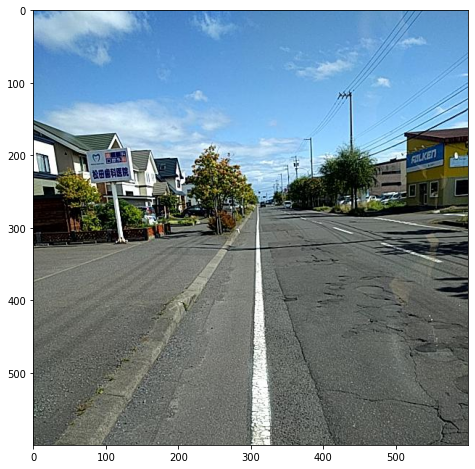

In [42]:

#!wget http://images.cocodataset.org/val2017/000000439715.jpg -q -O input.jpg
show_image_path = ROADDAMAGE_DATASET+"/train/Japan/images/Japan_000000.jpg"
print(show_image_path)
im = cv2.imread(show_image_path)
cv2_imshow(im)

Then, we create a detectron2 config and a detectron2 `DefaultPredictor` to run inference on this image.

# Train on a custom dataset

In this section, we show how to train an existing detectron2 model on a custom dataset in a new format.

We use [road damage detection dataset](https://github.com/sekilab/RoadDamageDetector/blob/master/RoadDamageDatasetTutorial.ipynb)
which only has few classes: 
```
    {
     "thing_classes": ["D00", "D01", "D10", "D11", "D20", "D40", "D43", "D44", "D50", "D0w0"]
    }
```
We'll train a model from an existing model pre-trained on COCO dataset, available in detectron2's model zoo.
Note that COCO dataset does not have these category. We'll be able to recognize this new class in a few minutes.

## Prepare the dataset
For Panoptic Segment look at https://github.com/celantur/panoptic_segm_demo/ 
- python generate-segmentation-files.py

Format to dict and register dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).
Here, the dataset is in its custom format, therefore we write a function to parse it and prepare it into detectron2's standard format. See the tutorial for more details.


In [43]:

# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")
# download, decompress the data
#!wget https://github.com/matterport/Mask_RCNN/releases/download/v2.1/balloon_dataset.zip
#!unzip balloon_dataset.zip > /dev/null

RDD_DAMAGE_CATEGORIES=[
        {"id": 1, "name": "D00", "color": [220, 20, 60] , "submission_superid": 1, "description": "Longitudinal Crack"}, 
        {"id": 2, "name": "D01", "color": [165, 42, 42] , "submission_superid": 1, "description": "Longitudinal Crack"}, 
        {"id": 3, "name": "D10", "color": [0, 0, 142]   , "submission_superid": 2, "description": "Transverse Crack"}, 
        {"id": 4, "name": "D11", "color": [0, 0, 70]    , "submission_superid": 2, "description": "Transverse Crack"}, 
        {"id": 5, "name": "D20", "color": [0, 60, 100]  , "submission_superid": 3, "description": "Aligator Crack"}, 
        {"id": 6, "name": "D40", "color": [0, 80, 100]  , "submission_superid": 4, "description": "Pothole"}, 
        {"id": 7, "name": "D43", "color": [0, 0, 230]   , "submission_superid": 4, "description": "Crosswalk blur"}, 
        {"id": 8, "name": "D44", "color": [119, 11, 32] , "submission_superid": 4, "description": "Whiteline blur"}, 
        {"id": 9, "name": "D50", "color": [128, 64, 128], "submission_superid": 4, "description": "Manhole lid/plate"},
        {"id": 10,"name": "D0w0","color": [96, 96, 96]  , "submission_superid": 4, "description": "Unknown"}
    ]

def get_rdd_coco_instances_meta():
    thing_ids = [k["id"] for k in RDD_DAMAGE_CATEGORIES]
    thing_names = [k["name"] for k in RDD_DAMAGE_CATEGORIES]
    thing_colors = [k["color"] for k in RDD_DAMAGE_CATEGORIES]
    assert len(thing_ids) == 10, len(thing_ids)
    # Mapping from the incontiguous COCO category id to an id in [0, 79]
    thing_dataset_id_to_contiguous_id = {k: i for i, k in enumerate(thing_ids)}
    thing_classes = [k["name"] for k in RDD_DAMAGE_CATEGORIES]
    ret = {
        "thing_dataset_id_to_contiguous_id": thing_dataset_id_to_contiguous_id,
        "thing_classes": thing_classes,
        "thing_colors": thing_colors,
        "thing_names" : thing_names,
        "stuff_classes" : []
    }
    return ret
    

In [44]:

from detectron2.structures import BoxMode
from xml.etree import ElementTree
from xml.dom import minidom

def load_images_ann_dicts(basepath, splits_per_dataset):
    dataset_dicts = []
    thing_ids   = [k["id"] for k in RDD_DAMAGE_CATEGORIES]
    thing_names = [k["name"] for k in RDD_DAMAGE_CATEGORIES]
    image_id_count = 0
    for idx, regions_data in enumerate(splits_per_dataset):
        # Assume pre-defined datasets live in `./datasets`.
        ann_path = os.path.join(basepath, regions_data, "annotations/xmls")
        img_path = os.path.join(basepath, regions_data, "images")
        
        # list annotations/xml dir and for each annotation load the data
        img_file_list = [filename for filename in os.listdir(img_path) if filename.endswith('.jpg')]
        print(idx,"\tLoading ", len(img_file_list),  " images from path = ", img_path)
        for img_id, img_filename in enumerate(img_file_list):
            image_id_count = image_id_count + 1
            record = {}
            annos = []
            ann_file = img_filename.split(".")[0] + ".xml"
            if os.path.isfile(os.path.join(ann_path, ann_file)):
                infile_xml = open(os.path.join(ann_path, ann_file))
                tree = ElementTree.parse(infile_xml)
                root = tree.getroot()
                img_height = int(root.find('size').find('height').text)
                img_width  = int(root.find('size').find('width').text)
                for obj in root.iter('object'):
                    cls_name, xmlbox = obj.find('name').text, obj.find('bndbox')
                    xmin, xmax = np.float(xmlbox.find('xmin').text), np.float(xmlbox.find('xmax').text)
                    ymin, ymax = np.float(xmlbox.find('ymin').text), np.float(xmlbox.find('ymax').text)
                    bbox = [xmin, ymin, xmax, ymax]       # (x0, y0, x1, y1)  -> (x0, y0, w, h) #bbox = BoxMode.convert(bbox, BoxMode.XYXY_ABS, BoxMode.XYWH_ABS) 
                    #if img_id < 5: 
                    #    print(img_id, "\t Ann Class: ", cls_name, ", BBox", (xmin, xmax, ymin, ymax))
                    anno = {
                      "category_id"   : thing_names.index(cls_name),
                      "category_name" : cls_name,
                      "bbox_mode"     : BoxMode.XYXY_ABS,  # (x0, y0, w, h) 
                      "bbox"          : bbox,
                      "iscrowd"       : 0
                    }
                    annos.append(anno)
            else:
                im = cv2.imread(os.path.join(img_path, img_filename))
                img_height = im.shape[0]
                img_width  = im.shape[1]
            record["image_id"] = image_id_count
            record["image_name"] = img_filename
            record["file_name"] = os.path.join(img_path, img_filename)
            record["height"] = img_height
            record["width"] = img_width
            record["annotations"] = annos
            record["supercategory"] = regions_data
            dataset_dicts.append(record)
    return dataset_dicts

In [45]:
DatasetCatalog.clear()
for dataset_name, splits_per_dataset in _PREDEFINED_SPLITS_GRC_MD["rdd2020"].items():
    inst_key = f"{dataset_name}"
    d = dataset_name.split("_")[1]
    print("[",d,"]\t",dataset_name, "\t", splits_per_dataset)
    DatasetCatalog.register(inst_key, lambda path=ROADDAMAGE_DATASET, d=deepcopy(splits_per_dataset) : load_images_ann_dicts(path, d))
    meta = get_rdd_coco_instances_meta()
    MetadataCatalog.get(inst_key).set(evaluator_type="coco", basepath=ROADDAMAGE_DATASET, splits_per_dataset=deepcopy(splits_per_dataset), **meta) 

[ val ]	 rdd2020_val 	 ('lval/Czech', 'lval/India', 'lval/Japan')
[ test ]	 rdd2020_test 	 ('ltest/Czech', 'ltest/India', 'ltest/Japan')
[ train ]	 rdd2020_train 	 ('ltrain/Czech', 'ltrain/India', 'ltrain/Japan')


To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set:



0 	Loading  785  images from path =  /media/rahul/Karmic/data/rdd2020/lval/Czech/images
1 	Loading  2978  images from path =  /media/rahul/Karmic/data/rdd2020/lval/India/images
2 	Loading  4071  images from path =  /media/rahul/Karmic/data/rdd2020/lval/Japan/images
/media/rahul/Karmic/data/rdd2020/lval/Japan/images/Japan_002889.jpg
/media/rahul/Karmic/data/rdd2020/lval/Japan/images/Japan_009376.jpg
/media/rahul/Karmic/data/rdd2020/lval/Japan/images/Japan_008972.jpg


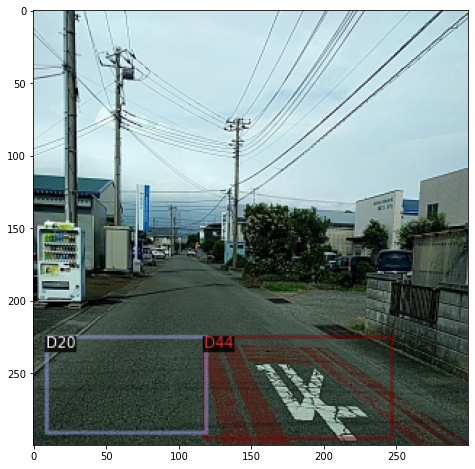

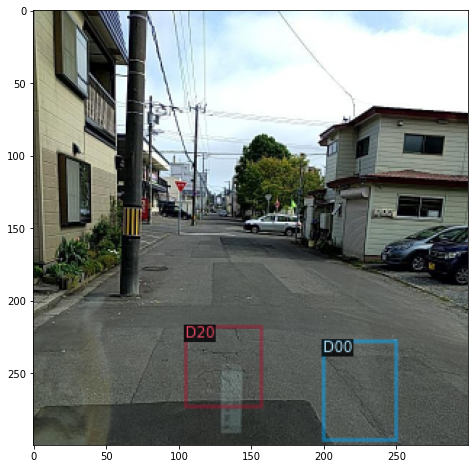

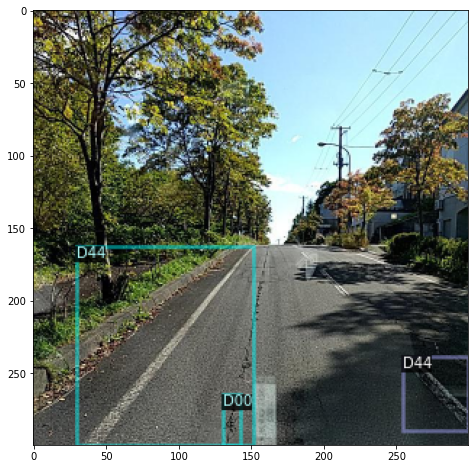

In [46]:
rdd2020_metadata = MetadataCatalog.get("rdd2020_val")
# Visualize Training Dataset
def visualise_dataset(data: str = "val"):
    dataset_name = "rdd2020_val"
    splits_per_dataset = ( "lval/Czech", "lval/India", "lval/Japan")
    dataset_dicts = load_images_ann_dicts(ROADDAMAGE_DATASET, splits_per_dataset)
    for d in random.sample(dataset_dicts, 3):
        print(d["file_name"])
        img = cv2.imread(d["file_name"])
        visualizer = Visualizer(img[:, :, ::-1], metadata=rdd2020_metadata, scale=0.5)
        out = visualizer.draw_dataset_dict(d)
        cv2_imshow(out.get_image()[:, :, ::-1])

visualise_dataset()

## Train!

Now, let's fine-tune a COCO-pretrained R50-FPN Mask R-CNN model on the balloon dataset. It takes ~6 minutes to train 300 iterations on Colab's K80 GPU, or ~2 minutes on a P100 GPU.


In [47]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator, DatasetEvaluators

class RDDTrainer(DefaultTrainer):
  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):
    if output_folder is None:
      os.makedirs(os.path.join(cfg.OUTPUT_DIR,"coco_eval"), exist_ok=True)
      output_folder=os.path.join(cfg.OUTPUT_DIR,"coco_eval")

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [48]:
# Configuration
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_1x.yaml"))
cfg.MODEL.WEIGHTS         = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_1x.yaml")  # Let training initialize from model zoo
cfg.DATASETS.TRAIN        = ("rdd2020_train",)
cfg.DATASETS.TEST         = ("rdd2020_val", )
cfg.OUTPUT_DIR            = "./output/run_rdd/"
cfg.MODEL.DEVICE          = "cuda"

In [49]:
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE  = 64   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES           = len(RDD_DAMAGE_CATEGORIES)  # only has one class (ballon)
cfg.SOLVER.CHECKPOINT_PERIOD              = 500

In [50]:
cfg.DATALOADER.NUM_WORKERS= 8
cfg.SOLVER.IMS_PER_BATCH  = 8
cfg.SOLVER.BASE_LR        = 0.001      # Pick a good LR
cfg.SOLVER.WARMUP_ITERS   = 100 
cfg.SOLVER.MAX_ITER       = 10000       # You may need to train longer for a practical dataset
cfg.SOLVER.STEPS          = (9000, 10000)
cfg.SOLVER.GAMMA          = 0.05
cfg.TEST.EVAL_PERIOD      = 500

Train

In [51]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = RDDTrainer(cfg) 
trainer.resume_or_load(resume=False)

[08/18 13:14:57 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Unable to load 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (11, 1024) in the model!
Unable to load 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (11,) in the model!
Unable to load 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (40, 1024) in the model!
Unable to load 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (40,) in the model!


In [ ]:
trainer.train()

In [ ]:
# Look at training curves in tensorboard:
#%load_ext tensorboard
#%tensorboard --logdir output/run_rdd/

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [52]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final_e10000_10classes_17Aug2020.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold for this model
cfg.DATASETS.TEST = ("rdd2020_val",)
predictor = DefaultPredictor(cfg)

Then, we randomly select several samples to visualize the prediction results.

0 	Loading  2978  images from path =  /media/rahul/Karmic/data/rdd2020/lval/India/images
1 	Loading  4071  images from path =  /media/rahul/Karmic/data/rdd2020/lval/Japan/images
0 .)  tensor([6, 6], device='cuda:0')
      tensor([0.9943, 0.7644], device='cuda:0')
1 .)  tensor([7, 7], device='cuda:0')
      tensor([0.9687, 0.8733], device='cuda:0')
2 .)  tensor([5, 5, 5, 5], device='cuda:0')
      tensor([0.9402, 0.8392, 0.7798, 0.7411], device='cuda:0')


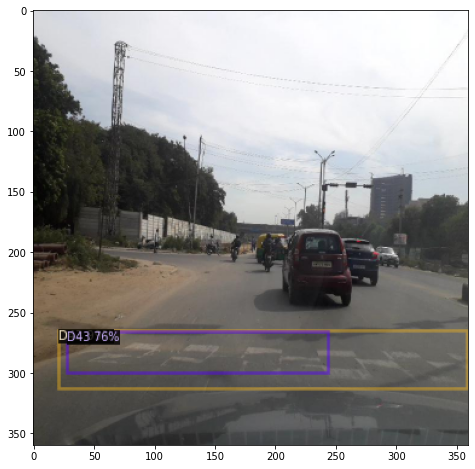

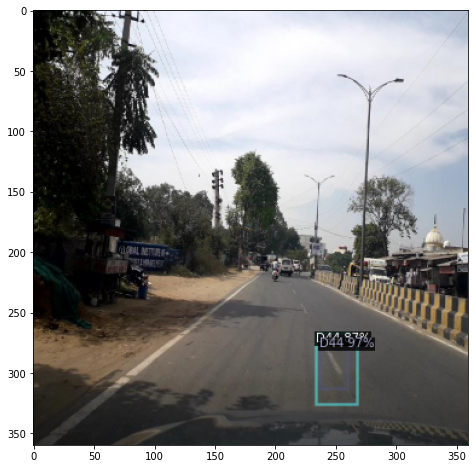

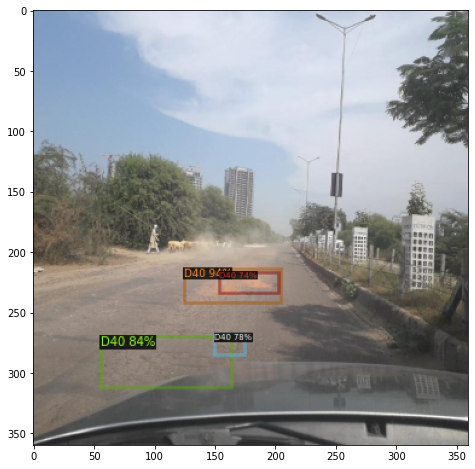

In [53]:
from detectron2.utils.visualizer import ColorMode
    
splits_per_dataset = ( "lval/India", "lval/Japan")
dataset_dicts = load_images_ann_dicts(ROADDAMAGE_DATASET, splits_per_dataset)

for idx, d in enumerate(random.sample(dataset_dicts, 3)):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    print(idx, ".) ", outputs["instances"].pred_classes)
    print("     ", outputs["instances"].scores)
    v = Visualizer(im[:, :, ::-1],
                   metadata=rdd2020_metadata, 
                   scale=0.5
    )

    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~70. Not bad!

In [54]:
from detectron2.evaluation import COCOEvaluator, DatasetEvaluators, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("rdd2020_val", cfg, False, "coco_eval")
val_loader = build_detection_test_loader(cfg, "rdd2020_val")
eval_results = inference_on_dataset(trainer.model, val_loader, DatasetEvaluators([evaluator]))

# another equivalent way is to use trainer.test
print(eval_results)

0 	Loading  785  images from path =  /media/rahul/Karmic/data/rdd2020/lval/Czech/images
1 	Loading  2978  images from path =  /media/rahul/Karmic/data/rdd2020/lval/India/images
2 	Loading  4071  images from path =  /media/rahul/Karmic/data/rdd2020/lval/Japan/images
[08/18 13:15:18 d2.data.common]: Serializing 7834 elements to byte tensors and concatenating them all ...
[08/18 13:15:18 d2.data.common]: Serialized dataset takes 2.92 MiB
[08/18 13:15:18 d2.data.dataset_mapper]: Augmentations used in training: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[08/18 13:15:18 d2.evaluation.evaluator]: Start inference on 7834 images
[08/18 13:15:19 d2.evaluation.evaluator]: Inference done 11/7834. 0.0543 s / img. ETA=0:07:11
[08/18 13:15:24 d2.evaluation.evaluator]: Inference done 101/7834. 0.0546 s / img. ETA=0:07:10
[08/18 13:15:29 d2.evaluation.evaluator]: Inference done 190/7834. 0.0546 s / img. ETA=0:07:07
[08/18 13:15:34 d2.evaluation.evaluator]: 

# Generate RDD2020 Submission dataset

In [55]:
splits_per_submission_dataset = ( "test1/India", "test1/Japan", "test1/Czech")
#splits_per_submission_dataset = ( "test/India", "test/Japan", "test/Czech")
dataset_test_submission_dicts = load_images_ann_dicts(ROADDAMAGE_DATASET, splits_per_submission_dataset)

0 	Loading  969  images from path =  /media/rahul/Karmic/data/rdd2020/test1/India/images
1 	Loading  1313  images from path =  /media/rahul/Karmic/data/rdd2020/test1/Japan/images
2 	Loading  349  images from path =  /media/rahul/Karmic/data/rdd2020/test1/Czech/images


**Submission**: https://rdd2020.sekilab.global/submissions/


For each image in the test dataset, your algorithm needs to predict a list of labels, and the corresponding bounding boxes.

The output is expected to contain the following two columns:
- ImageId: the id of the test image, for example, Adachi_test_00000001
- PredictionString: the prediction string should be a space-delimited of 5 integers. For example, 2 240 170 260 240 means it's label 2, with a bounding box of coordinates (x_min, y_min, x_max, y_max). We accept up to 5 predictions. For example, if you submit 3 42 24 170 186 1 292 28 430 198 4 168 24 292 190 5 299 238 443 374 2 160 195 294 357 6 3 214 135 356 which contains 6 bounding boxes, we will only take the first 5 into consideration.

----

> Damage Types = ["D00", "D01", "D10", "D11", "D20", "D40", "D43", "D44", "D50", "D0w0"]
- Classes of interest {D00: Longitudinal Crack, D10: Transverse Crack, D20: Aligator Crack, D40: Pothole}



In [59]:
map_classes_superids = []
for k in RDD_DAMAGE_CATEGORIES:
    print(k["id"], "\t", k["name"], "\t", k["submission_superid"], "\t", k["description"] )
    map_classes_superids.append(k["submission_superid"])

1 	 D00 	 1 	 Longitudinal Crack
2 	 D01 	 1 	 Longitudinal Crack
3 	 D10 	 2 	 Transverse Crack
4 	 D11 	 2 	 Transverse Crack
5 	 D20 	 3 	 Aligator Crack
6 	 D40 	 4 	 Pothole
7 	 D43 	 4 	 Crosswalk blur
8 	 D44 	 4 	 Whiteline blur
9 	 D50 	 4 	 Manhole lid/plate
10 	 D0w0 	 4 	 Unknown


## TODO
- [ ] Take the best 5 scoring/confidence results for submission

## Assumed !!
- Skipping results which are more than 5 in count
- Mapping the 10 classes to the 4 submission required classes !!

In [78]:
# Generate submission format result for RDD2020
def format_submission_result(image_meta, predictions):
    boxes = predictions.pred_boxes.tensor.numpy() if predictions.has("pred_boxes") else None
    scores = predictions.scores.numpy() if predictions.has("scores") else None
    classes = predictions.pred_classes.numpy() if predictions.has("pred_classes") else None
    formatted_result = ["{}".format(image_meta["image_name"])]
    if classes is not None:
        score_dict = {}
        for i, (cls, scr, bbx) in enumerate(zip(classes, scores, boxes)):
            (x_min, y_min, x_max, y_max) = bbx
            # Skipping results which are more than 5 
            if (int(cls) < 6) and i < 5:
                # class_submission_id, x_min, y_min, x_max, y_max
                out_str = "{0} {1} {2} {3} {4} ".format(map_classes_superids[int(cls)], int(x_min), int(y_min), int(x_max), int(y_max))
                score_dict[scr] = out_str
        result_item = ""
        for key in sorted(score_dict.keys()):
            result_item += score_dict[key]
        formatted_result.append(result_item)
    return formatted_result

In [79]:
from tqdm import tqdm

def generate_results():
    results = []
    for idx, d in tqdm(enumerate(dataset_test_submission_dicts)):
        im = cv2.imread(d["file_name"])
        outputs = predictor(im)
        formatted_result = format_submission_result(d, outputs["instances"].to("cpu"))
        if formatted_result is not None:
            results.append("{},{}".format(formatted_result[0], formatted_result[1]))
    return results

results = generate_results()
tqdm._instances.clear()

2631it [02:51, 15.32it/s]


In [80]:
def write_results_to_file():
    with open(os.path.join("./output/run_rdd/", 'hal_submission_rdd2020_e10k_class10_17Aug.txt'), 'w') as f:
      f.writelines("%s\n" % line for line in results)
write_results_to_file()

In [29]:
# Download the results
#from google.colab import files
#files.download('hal_submission_rdd2020.txt')
#files.download(os.path.join(cfg.OUTPUT_DIR, "model_final.pth"))

# Empty the GPU Memory 
torch.cuda.empty_cache()